# **Install PyCaret**

PyCaret is an open-source, low-code machine learning library in Python designed to make the end-to-end machine learning process easier and faster for both beginners and experienced data scientists. It offers a variety of tools and functions for data preparation, model training, model selection, and deployment.

pip3 install pycaret==2.3.6 is a command used to install a specific version of the PyCaret library in Python. If you encounter an error message, try running the code again.

In [ ]:
# install slim version (default)
!pip install pycaret

In [ ]:
# to check the installed version
from pycaret.utils import version
version()

'3.3.2'

**Install Analysis Extras for Explainable AI**

In [ ]:
!pip install pycaret[analysis]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.0/4.0 MB 59.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of dash-bootstrap-components to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.4/44.4 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.5/177.5 kB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 287.9/287.9 kB 20.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.6/16.6 MB 37.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 535.8/535.8 kB 14.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 20.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 53.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

## **Principal Component Analysis**

PCA stands for Principal Component Analysis, and it is a widely used technique in data analysis and machine learning for reducing the dimensionality of large datasets. The basic idea behind PCA is to transform a set of high-dimensional variables into a smaller set of uncorrelated variables called principal components, while retaining as much of the original variance as possible.

**Import Libraries**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [ ]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  2.1.4
Seaborn version:  0.13.2


**Dataset**





**Read the dataset**

**pd.read_csv** is a function in the pandas library in Python that is used to read a CSV (Comma Separated Values) file and convert it into a pandas DataFrame.

In [ ]:
#read cvs file into dataframe
df = pd.read_csv('https://raw.githubusercontent.com/MananMishra-7/INSE6220/main/parkinsons.data')
df=df.drop(['name'],axis=1)
df.head(25)

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,0.426,...,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,0.626,...,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,0.482,...,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,0.517,...,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,0.584,...,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335
5,120.552,131.162,113.787,0.00968,0.00008,0.00463,0.00750,0.01388,0.04701,0.456,...,0.06985,0.01222,21.378,1,0.415564,0.825069,-4.242867,0.299111,2.187560,0.357775
6,120.267,137.244,114.820,0.00333,0.00003,0.00155,0.00202,0.00466,0.01608,0.140,...,0.02337,0.00607,24.886,1,0.596040,0.764112,-5.634322,0.257682,1.854785,0.211756
7,107.332,113.840,104.315,0.00290,0.00003,0.00144,0.00182,0.00431,0.01567,0.134,...,0.02487,0.00344,26.892,1,0.637420,0.763262,-6.167603,0.183721,2.064693,0.163755
8,95.730,132.068,91.754,0.00551,0.00006,0.00293,0.00332,0.00880,0.02093,0.191,...,0.03218,0.01070,21.812,1,0.615551,0.773587,-5.498678,0.327769,2.322511,0.231571
9,95.056,120.103,91.226,0.00532,0.00006,0.00268,0.00332,0.00803,0.02838,0.255,...,0.04324,0.01022,21.862,1,0.547037,0.798463,-5.011879,0.325996,2.432792,0.271362


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   MDVP:Fo(Hz)       195 non-null    float64
 1   MDVP:Fhi(Hz)      195 non-null    float64
 2   MDVP:Flo(Hz)      195 non-null    float64
 3   MDVP:Jitter(%)    195 non-null    float64
 4   MDVP:Jitter(Abs)  195 non-null    float64
 5   MDVP:RAP          195 non-null    float64
 6   MDVP:PPQ          195 non-null    float64
 7   Jitter:DDP        195 non-null    float64
 8   MDVP:Shimmer      195 non-null    float64
 9   MDVP:Shimmer(dB)  195 non-null    float64
 10  Shimmer:APQ3      195 non-null    float64
 11  Shimmer:APQ5      195 non-null    float64
 12  MDVP:APQ          195 non-null    float64
 13  Shimmer:DDA       195 non-null    float64
 14  NHR               195 non-null    float64
 15  HNR               195 non-null    float64
 16  status            195 non-null    int64  
 1

In [ ]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


In [ ]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Exploratory Data Analysis**

**sns.pairplot** is a function in the seaborn library in Python that is used to plot pairwise relationships between multiple variables in a dataset. The resulting plot is a grid of scatterplots, with each variable plotted against every other variable.

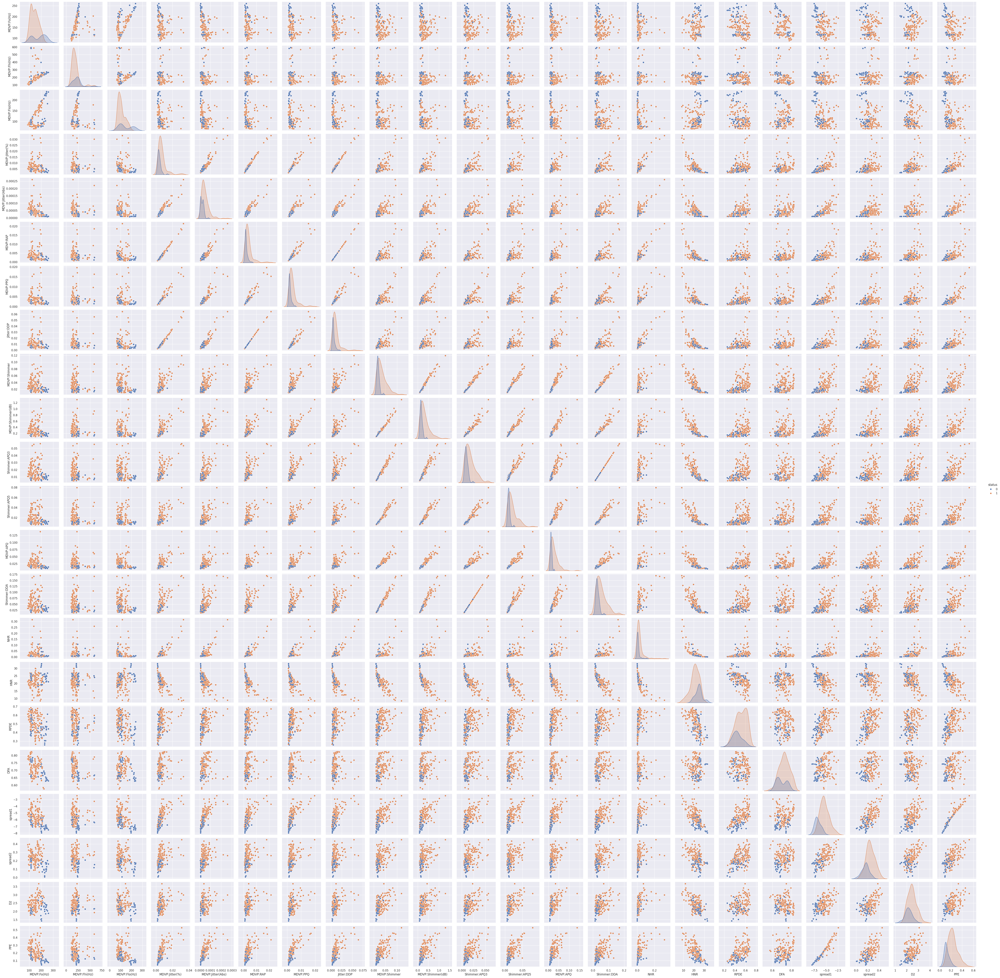

In [ ]:
sns.pairplot(df, hue='status')
plt.show()

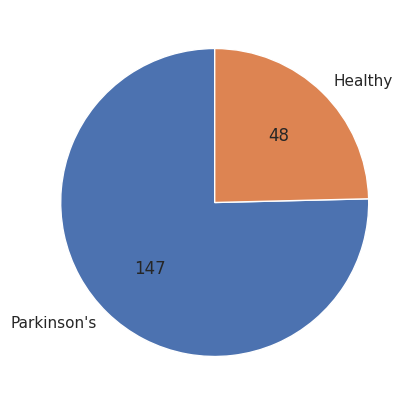

In [ ]:
# Pie chart of the 'status' column with exact instance counts
y = df['status']
counts = y.value_counts()

plt.figure(figsize=(7, 5))
plt.pie(counts, labels=counts.index.map({0: 'Healthy', 1: 'Parkinson\'s'}),
        autopct=lambda p: f'{int(p * sum(counts) / 100)}', startangle=90)
plt.ylabel('')  # Remove default y-label
plt.show()

**Data Matrix**

In [ ]:
X = df.drop(columns=['MDVP:Fhi(Hz)'])
X = X.drop(columns=['MDVP:Flo(Hz)'])
X = X.drop(columns=['MDVP:Jitter(%)'])
X = X.drop(columns=['MDVP:RAP'])
X = X.drop(columns=['MDVP:PPQ'])
X = X.drop(columns=['Jitter:DDP'])
X = X.drop(columns=['MDVP:Shimmer(dB)'])
X = X.drop(columns=['Shimmer:APQ3'])
X = X.drop(columns=['Shimmer:APQ5'])
X = X.drop(columns=['MDVP:APQ'])
X = X.drop(columns=['Shimmer:DDA'])
X = X.drop(columns=['NHR'])
X = X.drop(columns=['DFA'])
X = X.drop(columns=['spread2'])
X = X.drop(columns=['D2'])


X.head(10)

,MDVP:Fo(Hz),MDVP:Jitter(Abs),MDVP:Shimmer,HNR,status,RPDE,spread1,PPE
0,119.992,0.00007,0.04374,21.033,1,0.414783,-4.813031,0.284654
1,122.400,0.00008,0.06134,19.085,1,0.458359,-4.075192,0.368674
2,116.682,0.00009,0.05233,20.651,1,0.429895,-4.443179,0.332634
3,116.676,0.00009,0.05492,20.644,1,0.434969,-4.117501,0.368975
4,116.014,0.00011,0.06425,19.649,1,0.417356,-3.747787,0.410335
5,120.552,0.00008,0.04701,21.378,1,0.415564,-4.242867,0.357775
6,120.267,0.00003,0.01608,24.886,1,0.596040,-5.634322,0.211756
7,107.332,0.00003,0.01567,26.892,1,0.637420,-6.167603,0.163755
8,95.730,0.00006,0.02093,21.812,1,0.615551,-5.498678,0.231571
9,95.056,0.00006,0.02838,21.862,1,0.547037,-5.011879,0.271362


In [ ]:
X.describe()

,MDVP:Fo(Hz),MDVP:Jitter(Abs),MDVP:Shimmer,HNR,status,RPDE,spread1,PPE
count,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000
mean,154.228641,0.000044,0.029709,21.885974,0.753846,0.498536,-5.684397,0.206552
std,41.390065,0.000035,0.018857,4.425764,0.431878,0.103942,1.090208,0.090119
min,88.333000,0.000007,0.009540,8.441000,0.000000,0.256570,-7.964984,0.044539
25%,117.572000,0.000020,0.016505,19.198000,1.000000,0.421306,-6.450096,0.137451
50%,148.790000,0.000030,0.022970,22.085000,1.000000,0.495954,-5.720868,0.194052
75%,182.769000,0.000060,0.037885,25.075500,1.000000,0.587562,-5.046192,0.252980
max,260.105000,0.000260,0.119080,33.047000,1.000000,0.685151,-2.434031,0.527367


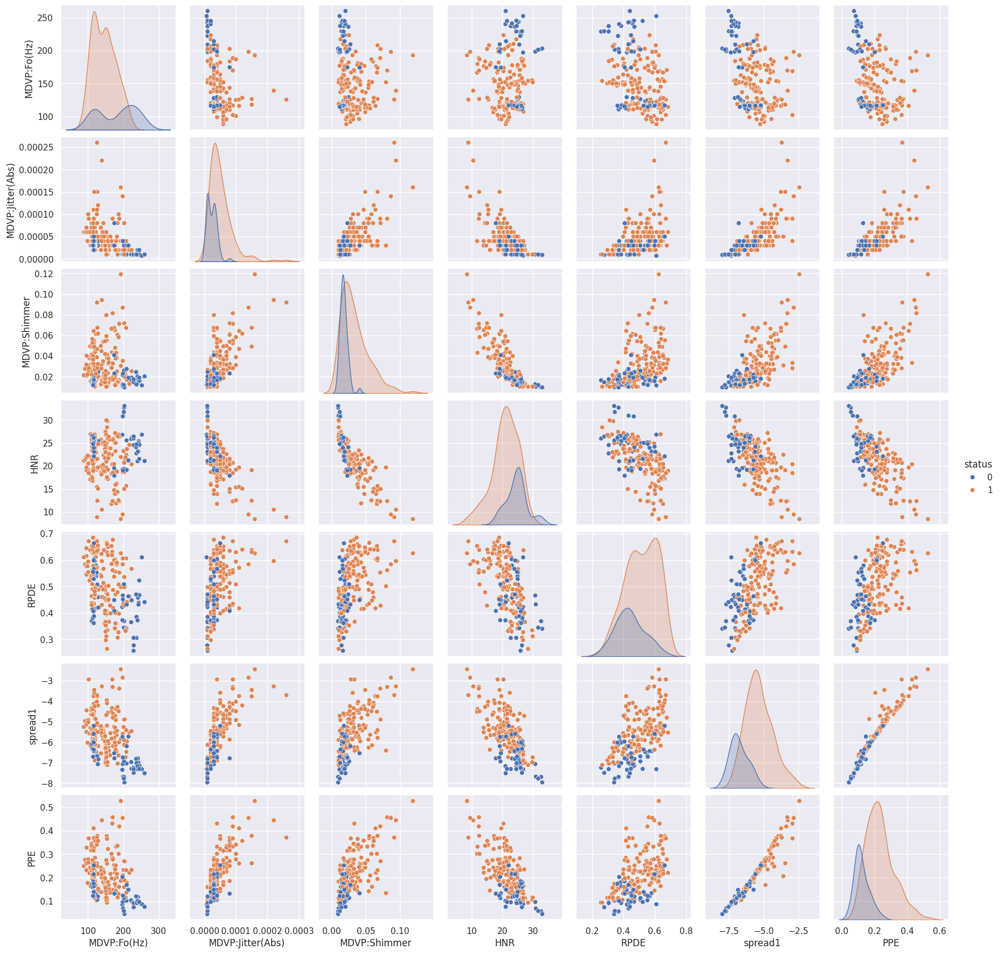

In [ ]:
#new pairplot after dropping features
sns.pairplot(X, hue='status')
plt.show()

In [ ]:
#dropping the traget variable
X = X.drop(columns=['status'])

In [ ]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
MDVP:Fo(Hz),195.0,154.228641,41.390065,88.333000,117.572000,148.790000,182.769000,260.105000
MDVP:Jitter(Abs),195.0,0.000044,0.000035,0.000007,0.000020,0.000030,0.000060,0.000260
MDVP:Shimmer,195.0,0.029709,0.018857,0.009540,0.016505,0.022970,0.037885,0.119080
HNR,195.0,21.885974,4.425764,8.441000,19.198000,22.085000,25.075500,33.047000
RPDE,195.0,0.498536,0.103942,0.256570,0.421306,0.495954,0.587562,0.685151
spread1,195.0,-5.684397,1.090208,-7.964984,-6.450096,-5.720868,-5.046192,-2.434031
PPE,195.0,0.206552,0.090119,0.044539,0.137451,0.194052,0.252980,0.527367


**Standardize the Data**

In [ ]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,MDVP:Fo(Hz),MDVP:Jitter(Abs),MDVP:Shimmer,HNR,RPDE,spread1,PPE
0,-0.829300,0.749759,0.745985,-0.193225,-0.807838,0.801323,0.868886
1,-0.770972,1.037674,1.681731,-0.634508,-0.387524,1.479853,1.803605
2,-0.909476,1.325589,1.202693,-0.279760,-0.662075,1.141445,1.402661
3,-0.909622,1.325589,1.340396,-0.281346,-0.613134,1.440945,1.806954
4,-0.925657,1.901418,1.836448,-0.506745,-0.783021,1.780940,2.267082
5,-0.815735,1.037674,0.919842,-0.115072,-0.800305,1.325656,1.682354
6,-0.822638,-0.401899,-0.724625,0.679600,0.940483,0.046050,0.057898
7,-1.135957,-0.401899,-0.746424,1.134021,1.339616,-0.444365,-0.476111
8,-1.416988,0.461845,-0.466763,-0.016758,1.128677,0.170790,0.278339
9,-1.433314,0.461845,-0.070666,-0.005431,0.467823,0.618459,0.721013


In [ ]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
MDVP:Fo(Hz),195.0,2.960595e-17,1.002574,-1.596162,-0.887918,-0.131738,0.691321,2.564598
MDVP:Jitter(Abs),195.0,9.109522e-17,1.002574,-1.064103,-0.689814,-0.401899,0.461845,6.220139
MDVP:Shimmer,195.0,2.368476e-16,1.002574,-1.072340,-0.702029,-0.358302,0.434690,4.751617
HNR,195.0,8.198570e-16,1.002574,-3.045707,-0.608910,0.045086,0.722527,2.528321
RPDE,195.0,-1.093143e-16,1.002574,-2.333888,-0.744921,-0.024900,0.858713,1.800007
spread1,195.0,1.202457e-15,1.002574,-2.097268,-0.704150,-0.033540,0.586904,2.989093
PPE,195.0,1.366428e-17,1.002574,-1.802384,-0.768742,-0.139058,0.516514,3.569059


**Observations and variables**

In [ ]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker Plots**

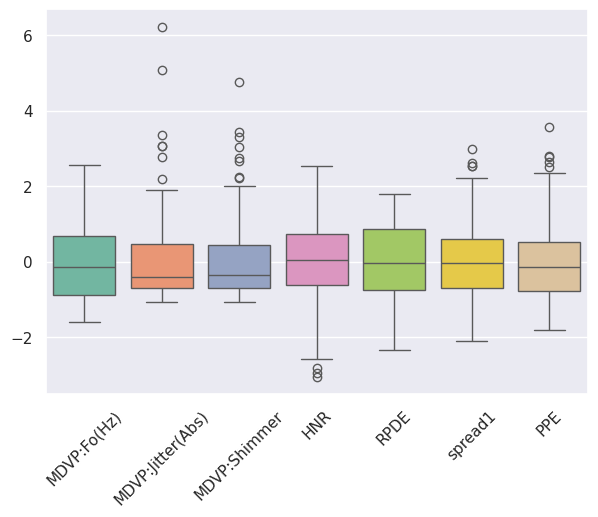

In [ ]:
ax = plt.figure()
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

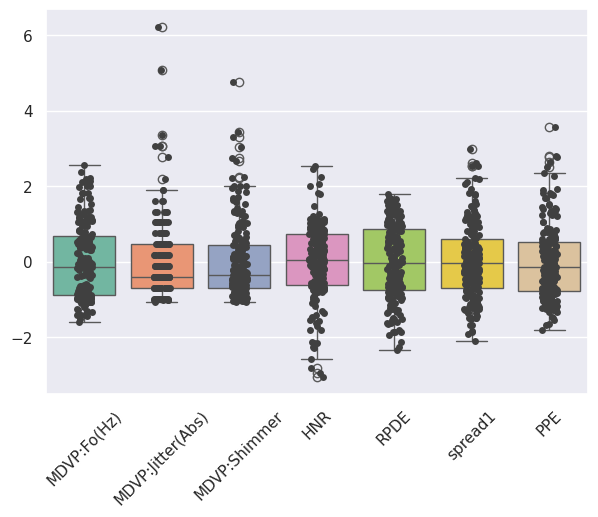

In [ ]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
ax = plt.figure()
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

**Correlation Matrix**

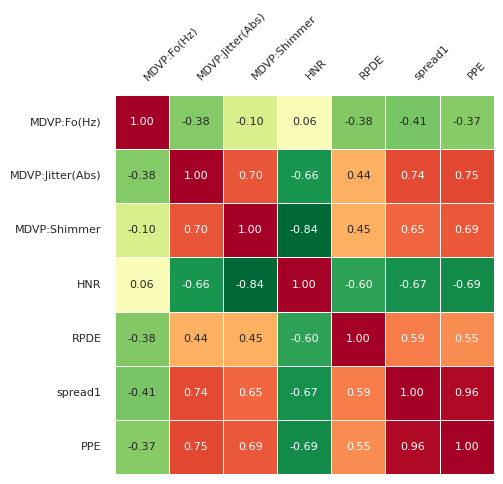

In [ ]:
plt.figure(figsize=(7, 5))  # Set figure size
ax = sns.heatmap(X.corr(),
                 cmap='RdYlGn_r',
                 linewidths=0.5,
                 annot=True,
                 cbar=False,
                 square=True,
                 annot_kws={"size": 8},  # Annotation (number) font size
                 fmt=".2f")

plt.yticks(rotation=0, fontsize=8)
ax.tick_params(labelbottom=False, labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=8)  # Slight rotation for better fit
ax.set_yticklabels(ax.get_yticklabels(), fontsize=8)

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

##**Applying PCA**

Text(0, 0.5, '$Z_2$')

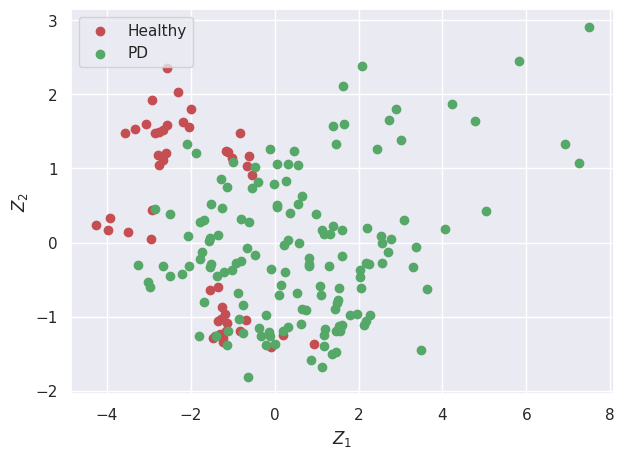

In [ ]:
pca = PCA()
Z = pca.fit_transform(X)

# 0 for healthy
# 1 for PD
idx_healthy = np.where(y == 0)
idx_pd = np.where(y == 1)


plt. figure()
plt.scatter(Z[idx_healthy,0], Z[idx_healthy,1], c='r', label='Healthy')
plt.scatter(Z[idx_pd,0], Z[idx_pd,1], c='g', label='PD')

plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

**Eigenvectors**

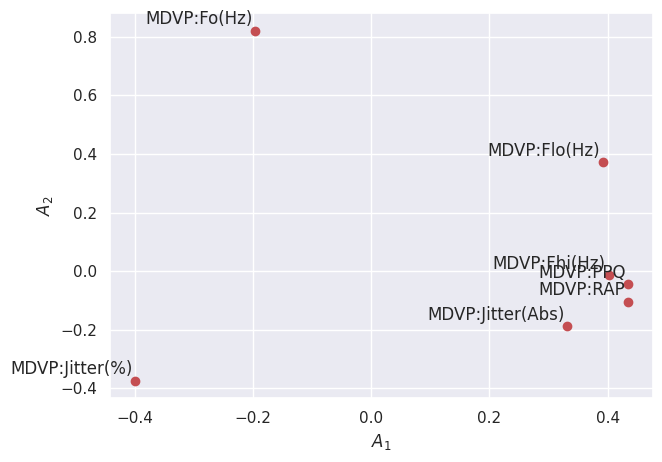

In [ ]:
A = pca.components_.T

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')

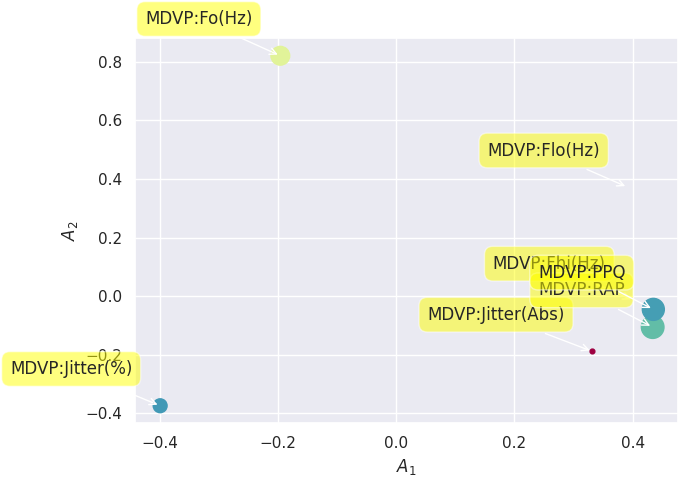

In [ ]:
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

**Scree plot**

Text(0, 0.5, 'Explained variance')

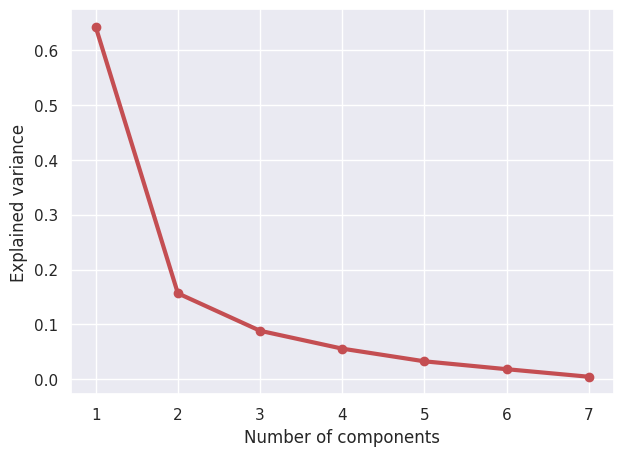

In [ ]:
#Eigenvalues
Lambda = pca.explained_variance_

#Scree plot
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')

**Explained Variance**

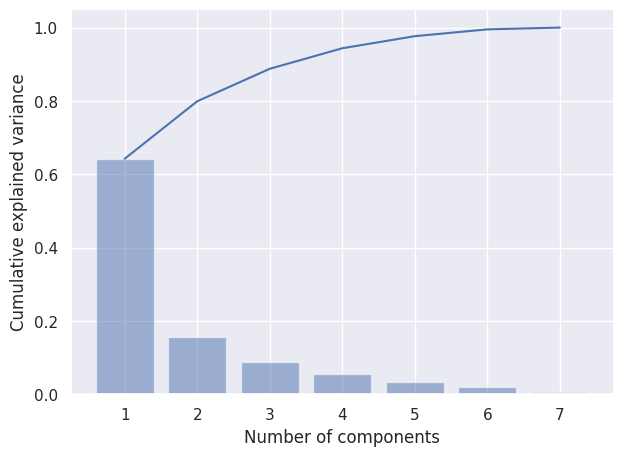

In [ ]:
ell = pca.explained_variance_ratio_
ind = np.arange(1, len(ell) + 1)  # Start from 1 instead of 0
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(ind, np.cumsum(ell))  # Make sure the x-values match
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.xticks(ind)  # Optional: ensures the ticks are labeled from 1 to 7
plt.show()


**Biplot**

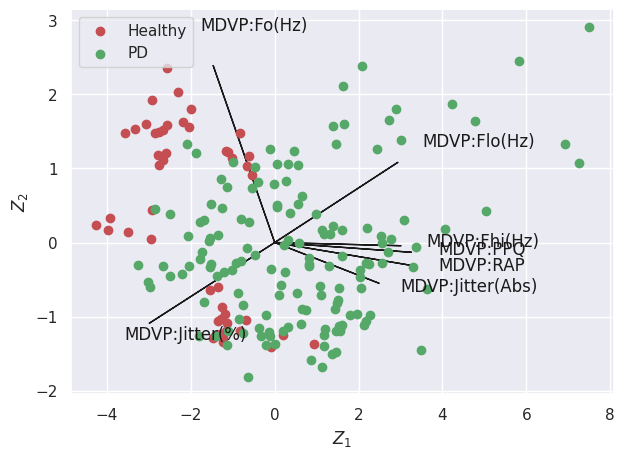

In [ ]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0]
A2 = A[:,1]
Z1 = Z[:,0]
Z2 = Z[:,1]

plt.figure()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_healthy,0], Z[idx_healthy,1], c='r', label='Healthy')
plt.scatter(Z[idx_pd,0], Z[idx_pd,1], c='g', label='PD')

plt.legend(loc='upper left')

##**Using PCA Library**

In [ ]:
!pip install pca

In [ ]:
from pca import pca
# Initialize and keep all PCs
model = pca(n_components=0.79)#if 0.8 is taken then 3 princiapl component will taken into account which will make it difficult to visualize few plots
#2 PC can explain 79.8% of variability in the data set
# Fit transform
out = model.fit_transform(X)

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [79.0%] explained variance using the [7] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [2] that covers the [79.00%] explained variance.
[pca] >The PCA reduction is performed on the [7] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


**Principal Components**

In [ ]:
out['PC']

,PC1,PC2
0,1.290182,-0.313418
1,2.777572,0.049517
2,2.178716,-0.273282
3,2.555366,-0.280846
4,3.365263,-0.058580
...,...,...
190,-0.666391,1.035064
191,-0.822074,1.483592
192,-0.549974,0.910047
193,-1.115878,1.227327


**Scatter plot**

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


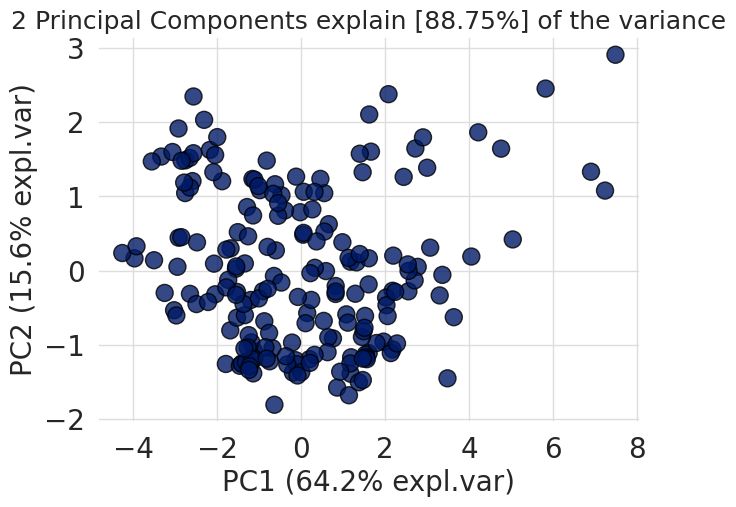

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size
fig, ax = plt.subplots(figsize=(7, 5))

# Create the scatter plot
model.scatter(label=True, legend=False, ax=ax)



# Show the plot
plt.show()


**Eigenvectors**

In [ ]:
A = out['loadings'].T

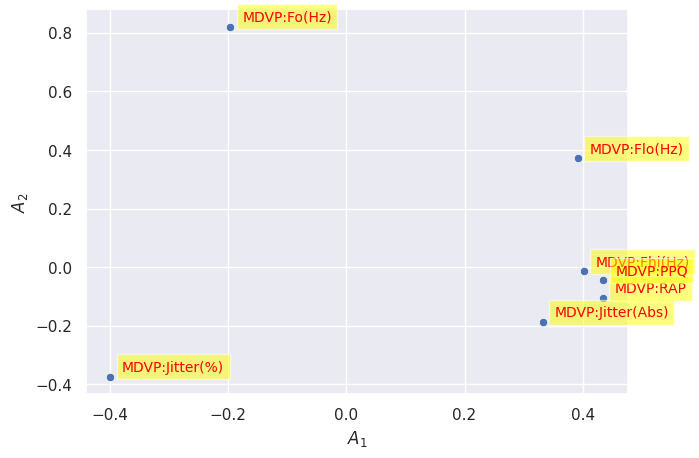

In [ ]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

**Scree Plot**

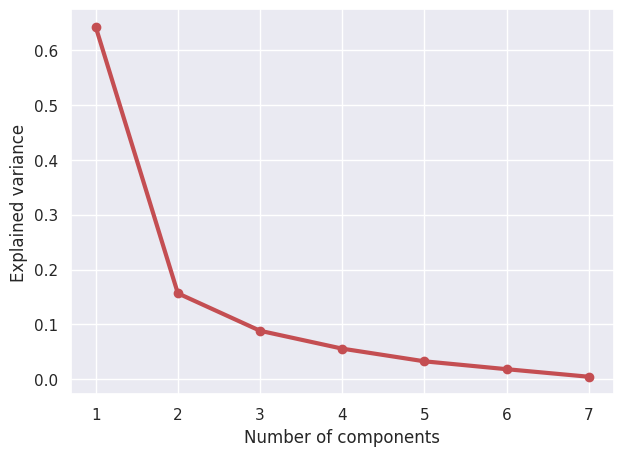

In [ ]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.show()

**Explained Variance Plot**

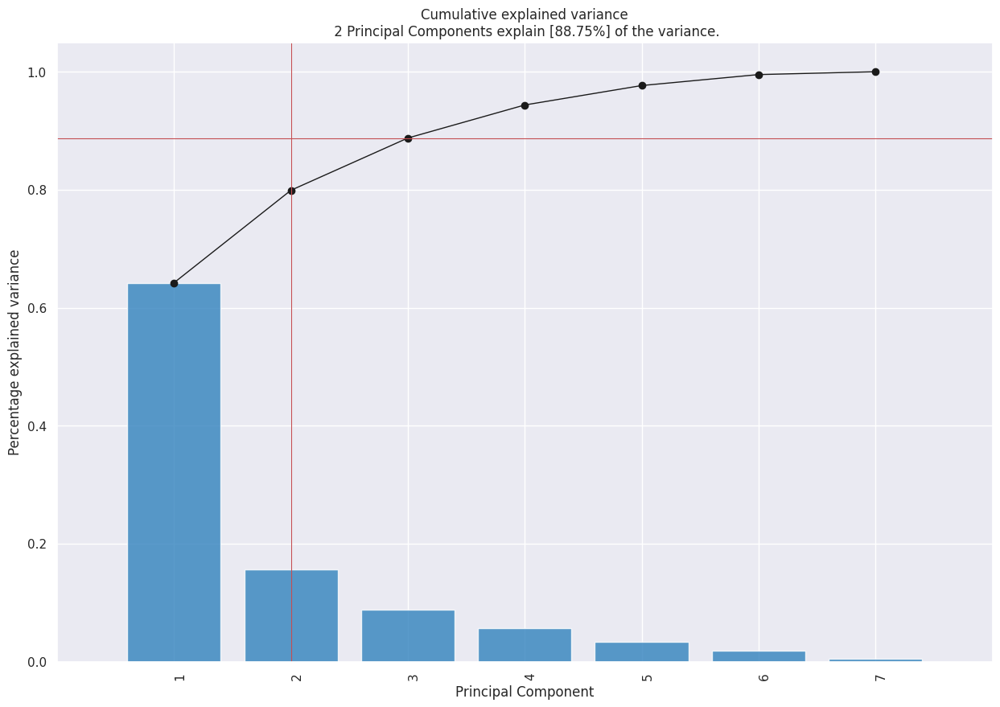

In [ ]:
model.plot();

**Biplot**

A biplot is a graphical representation of multivariate data that displays both observations and variables simultaneously in a single plot. Each observation is represented as a point in a two-dimensional plot, while the variables are represented as arrows or vectors that point in the direction of the greatest variation in the data. The length of the vector indicates the magnitude of the variable, while the angle between two vectors reflects their correlation.

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.
[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '2 Principal Components explain [88.75%] of the variance'}, xlabel='PC1 (64.2% expl.var)', ylabel='PC2 (15.6% expl.var)'>)

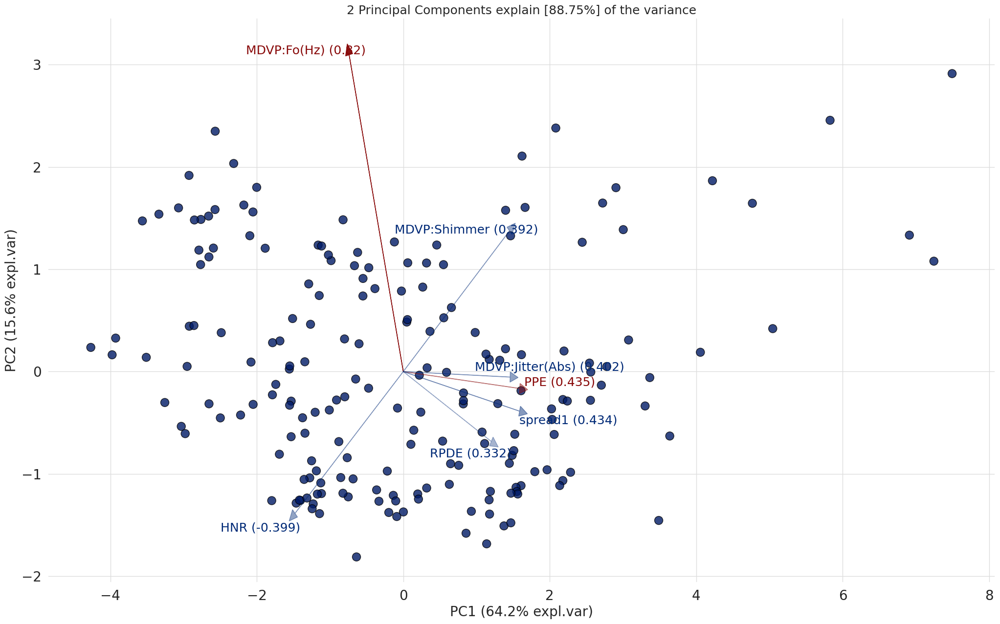

In [ ]:
model.biplot(label=False, legend=False)
#the diagram has a small problem here as the 2 principal components adds upto 79.8% and not 88.75%  It's most probably as it is adding the values of PC1 PC2 and PC3 all together as the the counter in python starts from 0

#**Multiclass Classification with PyCaret**

Multiclass classification is a supervised machine learning technique where the goal is to classify instances into one of three or more classes. (Classifying instances into one of two classes is called Binary Classification).

**Data Splitting**



In [ ]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (176, 23)
Unseen Data For Predictions: (19, 23)


**Setting up the Environment in PyCaret**

The **setup()** function initializes the environment in pycaret and creates the transformation pipeline to prepare the data for modeling and deployment. setup() must be called before executing any other function in pycaret. It takes two mandatory parameters: a pandas dataframe and the name of the target column. All other parameters are optional and are used to customize the pre-processing pipeline.

When setup() is executed, PyCaret's inference algorithm will automatically infer the data types for all features based on certain properties. The data type should be inferred correctly but this is not always the case. To account for this, PyCaret displays a table containing the features and their inferred data types after setup() is executed. If all of the data types are correctly identified enter can be pressed to continue or quit can be typed to end the expriment. Ensuring that the data types are correct is of fundamental importance in PyCaret as it automatically performs a few pre-processing tasks which are imperative to any machine learning experiment. These tasks are performed differently for each data type which means it is very important for them to be correctly configured.

In [ ]:
from pycaret.classification import *
clf = setup(data=data, target='status', train_size=0.7, session_id=123)

,Description,Value
0,Session id,123
1,Target,status
2,Target type,Binary
3,Original data shape,"(176, 23)"
4,Transformed data shape,"(176, 23)"
5,Transformed train set shape,"(123, 23)"
6,Transformed test set shape,"(53, 23)"
7,Numeric features,22
8,Preprocess,True
9,Imputation type,simple


**Comparing all Machine Learning Models**

In [ ]:
 #show the best model and their statistics
 best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.9186,0.9748,0.9778,0.9249,0.9486,0.7474,0.7749,0.1490
rf,Random Forest Classifier,0.8853,0.9367,0.9444,0.9088,0.9237,0.6768,0.6961,0.1850
xgboost,Extreme Gradient Boosting,0.8769,0.9348,0.9244,0.9186,0.9194,0.6493,0.6644,0.0790
lda,Linear Discriminant Analysis,0.8699,0.8648,0.9244,0.9071,0.9142,0.6392,0.6499,0.0260
knn,K Neighbors Classifier,0.8622,0.8541,0.9444,0.8860,0.9114,0.5670,0.5901,0.0290
lightgbm,Light Gradient Boosting Machine,0.8609,0.9130,0.9144,0.9111,0.9095,0.5990,0.6252,0.2250
gbc,Gradient Boosting Classifier,0.8519,0.8859,0.8911,0.9089,0.8939,0.6255,0.6332,0.1520
ridge,Ridge Classifier,0.8449,0.8959,0.9456,0.8688,0.9008,0.5123,0.5521,0.0260
lr,Logistic Regression,0.8442,0.9278,0.9233,0.8854,0.8992,0.5256,0.5476,0.8660
ada,Ada Boost Classifier,0.8365,0.9244,0.9133,0.8847,0.8951,0.5125,0.5407,0.2030


Processing:   0%|          | 0/65 [00:00<?, ?it/s]



For the remaining part of this tutorial, we will work with the below models as our candidate models. The selections are for illustration purposes only and do not necessarily mean they are the top performing or ideal for this type of data.

* Decision Tree Classifier ('dt')
* K Neighbors Classifier ('knn')
* Logistic Regression ('lr')


**Create Decision Tree Classifier**

In [ ]:
dt = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7692,0.6167,0.9000,0.8182,0.8571,0.2642,0.2725
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9231,0.9500,0.9000,1.0000,0.9474,0.8060,0.8216
3,0.9167,0.9500,0.9000,1.0000,0.9474,0.7500,0.7746
4,0.8333,0.7778,0.8889,0.8889,0.8889,0.5556,0.5556
5,0.7500,0.6111,0.8889,0.8000,0.8421,0.2500,0.2582
6,0.5000,0.5556,0.4444,0.8000,0.5714,0.0769,0.0976
7,0.9167,0.9444,0.8889,1.0000,0.9412,0.8000,0.8165
8,0.8333,0.7778,0.8889,0.8889,0.8889,0.5556,0.5556


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:

dt

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, random_state=123, splitter='best')

**Tune a Model:** How to automatically tune the hyper-parameters of a multiclass model. When a model is created using the create_model() function it uses the default hyperparameters. In order to tune hyperparameters, the tune_model() function is used. The tune_model() function is a random grid search of hyperparameters over a pre-defined search space. By default, it is set to optimize Accuracy but this can be changed using optimize parameter. This function automatically tunes the hyperparameters of a model on a pre-defined search space and scores it using stratified cross validation. The output prints a score grid that shows Accuracy, AUC, Recall, Precision, F1 and Kappa by fold.

**Tune Decision Tree Model**

In [ ]:
tuned_dt = tune_model(dt)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8462,0.9667,1.0000,0.8333,0.9091,0.4348,0.5270
1,0.9231,0.9667,0.9000,1.0000,0.9474,0.8060,0.8216
2,0.9231,0.8167,1.0000,0.9091,0.9524,0.7547,0.7785
3,0.8333,0.9500,0.8000,1.0000,0.8889,0.5714,0.6325
4,0.8333,0.9259,0.7778,1.0000,0.8750,0.6364,0.6831
5,0.8333,0.7778,0.8889,0.8889,0.8889,0.5556,0.5556
6,0.8333,0.5926,1.0000,0.8182,0.9000,0.4286,0.5222
7,0.9167,1.0000,1.0000,0.9000,0.9474,0.7500,0.7746
8,0.9167,0.9444,0.8889,1.0000,0.9412,0.8000,0.8165


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [ ]:
#tuned model object is stored in the variable 'tuned_dt'.
tuned_dt

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0002, min_samples_leaf=5,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, random_state=123, splitter='best')

**Evaluate Decision Tree Model**

How to analyze model performance using various plots

In [ ]:
evaluate_model(tuned_dt)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Create K Neighbors Model**

In [ ]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8462,0.7500,1.0000,0.8333,0.9091,0.4348,0.5270
1,0.7692,0.8500,1.0000,0.7692,0.8696,0.0000,0.0000
2,0.9231,0.9167,1.0000,0.9091,0.9524,0.7547,0.7785
3,0.9167,0.9500,1.0000,0.9091,0.9524,0.6250,0.6742
4,0.7500,0.8889,0.7778,0.8750,0.8235,0.4000,0.4082
5,0.7500,0.8333,0.7778,0.8750,0.8235,0.4000,0.4082
6,0.8333,0.8704,0.8889,0.8889,0.8889,0.5556,0.5556
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,0.9167,0.7778,1.0000,0.9000,0.9474,0.7500,0.7746


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

**Tune K Neighbors Model**

In [ ]:
tuned_knn = tune_model(knn, custom_grid = {'n_neighbors' : np.arange(0,50,1)})

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7692,0.3667,1.0000,0.7692,0.8696,0.0000,0.0000
1,0.7692,0.9000,1.0000,0.7692,0.8696,0.0000,0.0000
2,0.9231,0.9667,1.0000,0.9091,0.9524,0.7547,0.7785
3,0.8333,0.9500,1.0000,0.8333,0.9091,0.0000,0.0000
4,0.9167,0.7963,1.0000,0.9000,0.9474,0.7500,0.7746
5,0.8333,0.7222,1.0000,0.8182,0.9000,0.4286,0.5222
6,0.8333,0.9074,1.0000,0.8182,0.9000,0.4286,0.5222
7,0.8333,0.9259,1.0000,0.8182,0.9000,0.4286,0.5222
8,0.8333,0.7778,1.0000,0.8182,0.9000,0.4286,0.5222


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


**Evaluate K Neighbors Model**

In [ ]:
evaluate_model(tuned_knn)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Create Logistic Regression Model**

In [ ]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7692,0.8333,1.0000,0.7692,0.8696,0.0000,0.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9231,1.0000,1.0000,0.9091,0.9524,0.7547,0.7785
3,0.9167,1.0000,0.9000,1.0000,0.9474,0.7500,0.7746
4,0.9167,0.9630,0.8889,1.0000,0.9412,0.8000,0.8165
5,0.7500,0.9259,0.8889,0.8000,0.8421,0.2500,0.2582
6,0.6667,0.8148,0.6667,0.8571,0.7500,0.2727,0.2928
7,0.9167,0.9630,1.0000,0.9000,0.9474,0.7500,0.7746
8,0.8333,0.9259,1.0000,0.8182,0.9000,0.4286,0.5222


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
lr

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

**Tune Logistic Regression Model**

In [ ]:
tuned_lr = tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8462,0.8333,1.0000,0.8333,0.9091,0.4348,0.5270
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9167,0.9500,0.9000,1.0000,0.9474,0.7500,0.7746
4,0.9167,1.0000,0.8889,1.0000,0.9412,0.8000,0.8165
5,0.7500,0.8889,0.8889,0.8000,0.8421,0.2500,0.2582
6,0.7500,0.8519,0.7778,0.8750,0.8235,0.4000,0.4082
7,0.9167,0.9630,1.0000,0.9000,0.9474,0.7500,0.7746
8,0.8333,0.9259,1.0000,0.8182,0.9000,0.4286,0.5222


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


**Evaluate Logistic Regression Model**

In [ ]:
tuned_lr

LogisticRegression(C=7.863, class_weight={}, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
evaluate_model(tuned_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

#**Classification + PCA**

In [ ]:
clf_pca = setup(data=data, target='status', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 2)

,Description,Value
0,Session id,123
1,Target,status
2,Target type,Binary
3,Original data shape,"(176, 23)"
4,Transformed data shape,"(176, 3)"
5,Transformed train set shape,"(123, 3)"
6,Transformed test set shape,"(53, 3)"
7,Numeric features,22
8,Preprocess,True
9,Imputation type,simple


In [ ]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
xgboost,Extreme Gradient Boosting,0.8686,0.8907,0.9344,0.9086,0.9148,0.6053,0.6569,0.0570
knn,K Neighbors Classifier,0.8679,0.8959,0.9344,0.9032,0.9147,0.6114,0.6429,0.0570
lightgbm,Light Gradient Boosting Machine,0.8609,0.9154,0.9033,0.9225,0.9059,0.6182,0.6543,0.1300
rf,Random Forest Classifier,0.8532,0.9209,0.9456,0.8806,0.9075,0.5301,0.5679,0.2760
ridge,Ridge Classifier,0.8526,0.8459,0.9456,0.8783,0.9064,0.5340,0.5711,0.0390
et,Extra Trees Classifier,0.8526,0.9365,0.9233,0.8909,0.9023,0.5753,0.6042,0.1570
gbc,Gradient Boosting Classifier,0.8455,0.8961,0.9022,0.9074,0.8969,0.5497,0.5788,0.1600
lr,Logistic Regression,0.8442,0.8624,0.9344,0.8765,0.8990,0.5213,0.5595,0.0570
dt,Decision Tree Classifier,0.8442,0.7850,0.9033,0.9034,0.8988,0.5511,0.5777,0.0370
lda,Linear Discriminant Analysis,0.8365,0.8459,0.9244,0.8745,0.8954,0.5031,0.5289,0.0370


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [ ]:
knn_pca = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,0.9231,1.0000,1.0000,0.9091,0.9524,0.7547,0.7785
2,0.9231,0.9667,1.0000,0.9091,0.9524,0.7547,0.7785
3,0.9167,0.9000,0.9000,1.0000,0.9474,0.7500,0.7746
4,0.8333,0.9444,0.7778,1.0000,0.8750,0.6364,0.6831
5,0.8333,0.8148,1.0000,0.8182,0.9000,0.4286,0.5222
6,0.8333,0.8704,0.8889,0.8889,0.8889,0.5556,0.5556
7,0.8333,1.0000,1.0000,0.8182,0.9000,0.4286,0.5222
8,0.7500,0.7037,0.8889,0.8000,0.8421,0.2500,0.2582


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
knn_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

In [ ]:
tuned_knn_pca = tune_model(knn_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9231,0.9667,1.0000,0.9091,0.9524,0.7547,0.7785
3,0.9167,0.9500,0.9000,1.0000,0.9474,0.7500,0.7746
4,0.9167,0.9630,0.8889,1.0000,0.9412,0.8000,0.8165
5,0.9167,1.0000,1.0000,0.9000,0.9474,0.7500,0.7746
6,0.8333,0.9630,0.8889,0.8889,0.8889,0.5556,0.5556
7,0.9167,1.0000,1.0000,0.9000,0.9474,0.7500,0.7746
8,0.7500,0.8889,0.8889,0.8000,0.8421,0.2500,0.2582


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [ ]:
tuned_knn_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
                     metric_params=None, n_jobs=-1, n_neighbors=12, p=2,
                     weights='distance')

In [ ]:
evaluate_model(tuned_knn_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [ ]:
lr_pca = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7692,0.7000,1.0000,0.7692,0.8696,0.0000,0.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9231,0.9000,1.0000,0.9091,0.9524,0.7547,0.7785
3,0.9167,0.9500,0.9000,1.0000,0.9474,0.7500,0.7746
4,0.7500,0.9259,0.7778,0.8750,0.8235,0.4000,0.4082
5,0.8333,0.9259,1.0000,0.8182,0.9000,0.4286,0.5222
6,0.6667,0.6296,0.6667,0.8571,0.7500,0.2727,0.2928
7,0.9167,0.9259,1.0000,0.9000,0.9474,0.7500,0.7746
8,0.8333,0.8148,1.0000,0.8182,0.9000,0.4286,0.5222


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
lr_pca

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
tuned_lr_pca = tune_model(lr_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7692,0.7000,1.0000,0.7692,0.8696,0.0000,0.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9231,0.9000,1.0000,0.9091,0.9524,0.7547,0.7785
3,0.9167,0.9500,0.9000,1.0000,0.9474,0.7500,0.7746
4,0.8333,0.9259,0.8889,0.8889,0.8889,0.5556,0.5556
5,0.8333,0.9259,1.0000,0.8182,0.9000,0.4286,0.5222
6,0.6667,0.6296,0.6667,0.8571,0.7500,0.2727,0.2928
7,0.9167,0.9259,1.0000,0.9000,0.9474,0.7500,0.7746
8,0.8333,0.8148,1.0000,0.8182,0.9000,0.4286,0.5222


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [ ]:
tuned_lr_pca

LogisticRegression(C=0.056, class_weight={}, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
evaluate_model(tuned_lr_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

#**Explainable AI with Shapley values**

Shapley values are a widely used approach from cooperative game theory that come with desirable properties.

In [ ]:
dt_pca = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7692,0.6167,0.9000,0.8182,0.8571,0.2642,0.2725
1,0.9231,0.8333,1.0000,0.9091,0.9524,0.7547,0.7785
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.8333,0.9000,0.8000,1.0000,0.8889,0.5714,0.6325
4,0.8333,0.8889,0.7778,1.0000,0.8750,0.6364,0.6831
5,0.8333,0.6667,1.0000,0.8182,0.9000,0.4286,0.5222
6,0.9167,0.9444,0.8889,1.0000,0.9412,0.8000,0.8165
7,0.7500,0.6111,0.8889,0.8000,0.8421,0.2500,0.2582
8,0.7500,0.6111,0.8889,0.8000,0.8421,0.2500,0.2582


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
dt_pca

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, random_state=123, splitter='best')

In [ ]:
tuned_dt_pca = tune_model(dt_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9231,1.0000,0.9000,1.0000,0.9474,0.8060,0.8216
1,0.9231,1.0000,1.0000,0.9091,0.9524,0.7547,0.7785
2,0.9231,0.8833,1.0000,0.9091,0.9524,0.7547,0.7785
3,0.9167,1.0000,0.9000,1.0000,0.9474,0.7500,0.7746
4,0.7500,0.9815,0.6667,1.0000,0.8000,0.5000,0.5774
5,0.8333,0.8148,0.8889,0.8889,0.8889,0.5556,0.5556
6,0.9167,0.9259,0.8889,1.0000,0.9412,0.8000,0.8165
7,0.9167,0.8333,1.0000,0.9000,0.9474,0.7500,0.7746
8,0.8333,0.7407,1.0000,0.8182,0.9000,0.4286,0.5222


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [ ]:
evaluate_model(tuned_dt_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**SHAP Summary Plot**

Rather than using a typical feature importance bar chart, we use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples.

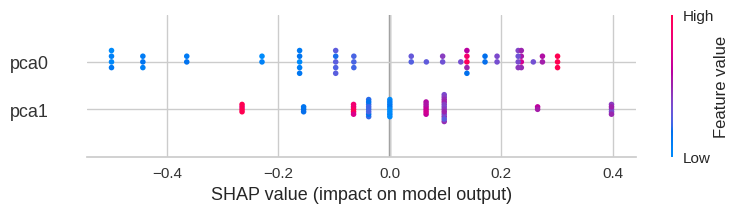

In [ ]:
interpret_model(tuned_dt_pca, plot='summary')

In [ ]:
interpret_model(tuned_dt_pca, plot='reason', observation=32)

From the above the plot, we can see the "base value," which is defined as the mean predicted target; and f(x), which is the prediction for a selected observation (i.e. observation number 32). The red-colored features increased the predicted value, while the blue-colored features decreased it. The size of each feature (i.e. Principal Component) indicates the impact it has on the model.

**Visualize many predictions**

In [ ]:
interpret_model(tuned_dt_pca, plot='reason')